In [1]:
import sys
import tensorflow as tf
sys.path.append("/visuworks/Blindless_AIFFELTON/Models")

# import customized modules
import preprocess, data_generator, check_result, metrics, loss, train

sys.path.append("/visuworks/Blindless_AIFFELTON/Models/FR_Unet")
import fr_unet

# Insert Path
# {model_name}_{epoch}ep_{model_inpusize}_{Generator | aG/fG/sG}
FILE_NAME = 'fr_unet_40ep_64_512_sG'
INPUT_SHAPE = (64, 64, 1)
RESIZE_SHAPE = (512, 512, 1)
MODEL_PATH = "/visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/" + FILE_NAME + ".tf"
HISTORY_PATH = "/visuworks/Blindless_AIFFELTON/Models/FR_Unet/history/" + FILE_NAME + '_history' ".json"
SOURCE = '/visuworks/Dataset/Selected Dataset 2'

2024-01-29 06:55:33.756283: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-29 06:55:33.756308: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-29 06:55:33.757383: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-29 06:55:33.762736: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-01-29 06:55:34.344846: W tensorflow/compiler/tf2

In [2]:
# Define custom objects for loading the model
custom_objects = {'DiceLoss': loss.DiceLoss(), 
                  'sensitivity': metrics.sensitivity,
                  'specificity': metrics.specificity,
                  'accuracy' : metrics.accuracy}


# Create augmentation
train_preproc = preprocess.build_augmentation_for_general(RESIZE_SHAPE[0], RESIZE_SHAPE[0])
test_preproc = preprocess.build_augmentation_for_general(RESIZE_SHAPE[0], RESIZE_SHAPE[0], is_train=False)

# Create train, test generator
train_generator = data_generator.SlicedDataGenerator(
    SOURCE, 
    number_of_images = 1,
    img_size=INPUT_SHAPE,
    output_size=INPUT_SHAPE,
    resize_shape = RESIZE_SHAPE,
    is_train=True,
    augmentation= train_preproc
)

test_generator = data_generator.SlicedDataGenerator(
    SOURCE,
    number_of_images = 1,
    img_size=INPUT_SHAPE,
    output_size=INPUT_SHAPE,
    resize_shape = RESIZE_SHAPE,
    is_train=False,
    augmentation= test_preproc
)

# Create model
model = fr_unet.FR_UNet(num_classes=1, feature_scale=2, dropout=0.2, fuse=True, out_ave=True)

# # Input shape
input_shape = (64, 64, 1)

# # Build the model with the specified input shape
model.build(input_shape=(None, *input_shape))

# # Display the model summary
model.summary()

2024-01-29 06:55:35.518915: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-01-29 06:55:35.552568: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-01-29 06:55:35.552784: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

Model: "fr_u_net"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block (Block)               multiple                  23648     
                                                                 
 block_1 (Block)             multiple                  42496     
                                                                 
 block_2 (Block)             multiple                  81408     
                                                                 
 block_3 (Block)             multiple                  81408     
                                                                 
 block_4 (Block)             multiple                  81408     
                                                                 
 block_5 (Block)             multiple                  37120     
                                                                 
 block_6 (Block)             multiple                  371

In [3]:
train.model_train(model,
                  epoch = 40,
                  train_generator = train_generator,
                  test_generator = test_generator,
                  model_path = MODEL_PATH,
                  history_path = HISTORY_PATH)


Epoch 00001: WeightDecayScheduler setting learning rate to 9.999899747381279e-05.
Epoch 1/40


2024-01-28 14:21:47.642516: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infr_u_net/block/conv_block/sequential/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
2024-01-28 14:21:48.773469: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8904
2024-01-28 14:21:51.508318: I external/local_xla/xla/service/service.cc:168] XLA service 0x7f7bce2dd4a0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-01-28 14:21:51.508335: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3080 Ti, Compute Capability 8.6
2024-01-28 14:21:51.511604: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1706451711.577215  193274 device_compiler.h:1

1177/1177 [==============================] - ETA: 0s - loss: 0.3940 - sensitivity: 0.6627 - specificity: 0.9587 - accuracy: 0.9386
Epoch 1: val_sensitivity improved from -inf to 0.67047, saving model to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/sd_unet_40ep_512_sG.tf


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/sd_unet_40ep_512_sG.tf/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/sd_unet_40ep_512_sG.tf/assets


1177/1177 [==============================] - 287s 221ms/step - loss: 0.3940 - sensitivity: 0.6627 - specificity: 0.9587 - accuracy: 0.9386 - val_loss: 0.2886 - val_sensitivity: 0.6705 - val_specificity: 0.9769 - val_accuracy: 0.9575

Epoch 00002: WeightDecayScheduler setting learning rate to 9.99980006775877e-05.
Epoch 2/40
1177/1177 [==============================] - ETA: 0s - loss: 0.2857 - sensitivity: 0.7076 - specificity: 0.9766 - accuracy: 0.9585
Epoch 2: val_sensitivity improved from 0.67047 to 0.76829, saving model to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/sd_unet_40ep_512_sG.tf


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/sd_unet_40ep_512_sG.tf/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/sd_unet_40ep_512_sG.tf/assets


1177/1177 [==============================] - 258s 219ms/step - loss: 0.2857 - sensitivity: 0.7076 - specificity: 0.9766 - accuracy: 0.9585 - val_loss: 0.2650 - val_sensitivity: 0.7683 - val_specificity: 0.9691 - val_accuracy: 0.9569

Epoch 00003: WeightDecayScheduler setting learning rate to 9.999700388136262e-05.
Epoch 3/40
1177/1177 [==============================] - ETA: 0s - loss: 0.2645 - sensitivity: 0.7210 - specificity: 0.9787 - accuracy: 0.9615
Epoch 3: val_sensitivity did not improve from 0.76829
1177/1177 [==============================] - 235s 200ms/step - loss: 0.2645 - sensitivity: 0.7210 - specificity: 0.9787 - accuracy: 0.9615 - val_loss: 0.2534 - val_sensitivity: 0.7548 - val_specificity: 0.9740 - val_accuracy: 0.9604

Epoch 00004: WeightDecayScheduler setting learning rate to 9.999600708513754e-05.
Epoch 4/40
1177/1177 [==============================] - ETA: 0s - loss: 0.2502 - sensitivity: 0.7306 - specificity: 0.9799 - accuracy: 0.9633
Epoch 4: val_sensitivity did n

INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/sd_unet_40ep_512_sG.tf/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/sd_unet_40ep_512_sG.tf/assets


1177/1177 [==============================] - 258s 219ms/step - loss: 0.2182 - sensitivity: 0.7540 - specificity: 0.9821 - accuracy: 0.9673 - val_loss: 0.2270 - val_sensitivity: 0.8032 - val_specificity: 0.9731 - val_accuracy: 0.9628

Epoch 00014: WeightDecayScheduler setting learning rate to 9.998603912288672e-05.
Epoch 14/40
1177/1177 [==============================] - ETA: 0s - loss: 0.2164 - sensitivity: 0.7566 - specificity: 0.9821 - accuracy: 0.9674
Epoch 14: val_sensitivity did not improve from 0.80322
1177/1177 [==============================] - 236s 201ms/step - loss: 0.2164 - sensitivity: 0.7566 - specificity: 0.9821 - accuracy: 0.9674 - val_loss: 0.2239 - val_sensitivity: 0.7760 - val_specificity: 0.9778 - val_accuracy: 0.9654

Epoch 00015: WeightDecayScheduler setting learning rate to 9.998504232666165e-05.
Epoch 15/40
1177/1177 [==============================] - ETA: 0s - loss: 0.2147 - sensitivity: 0.7568 - specificity: 0.9823 - accuracy: 0.9677
Epoch 15: val_sensitivity d

500/500 [==============================] - 38s 76ms/step - loss: 0.2272 - sensitivity: 0.7086 - specificity: 0.9850 - accuracy: 0.9675
Loss: 0.22723035514354706
Sensitivity: 0.708574116230011
Specificity: 0.9850069284439087
Accuracy: 0.9674586653709412


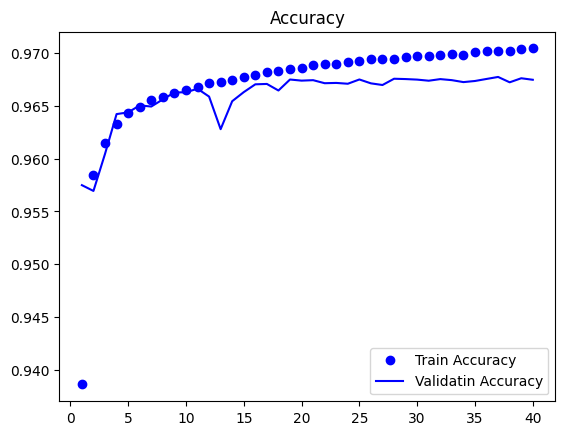

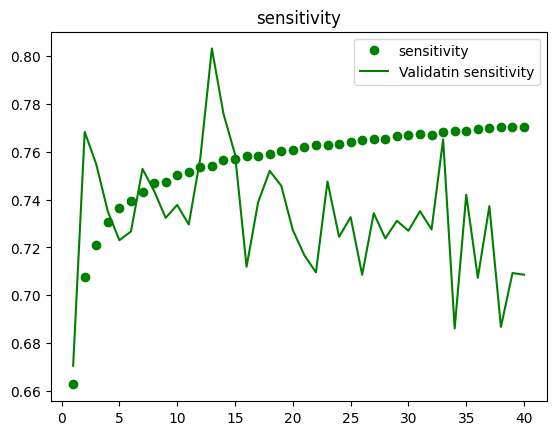

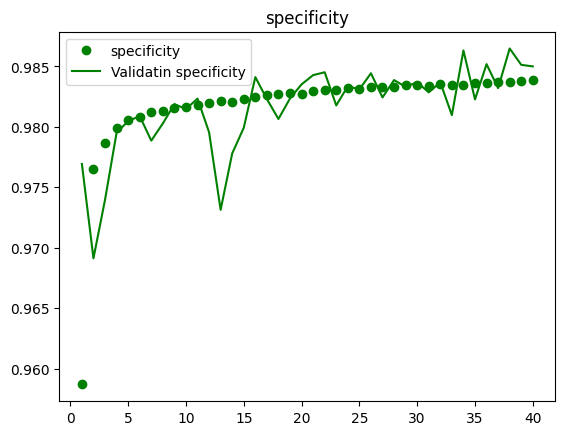

<Figure size 640x480 with 0 Axes>

In [4]:
# Plot history and pring evaluation of test dataset
metrics.print_evaluation(model, test_generator)
check_result.plot_history(HISTORY_PATH)

2024-01-29 06:55:47.887202: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8904


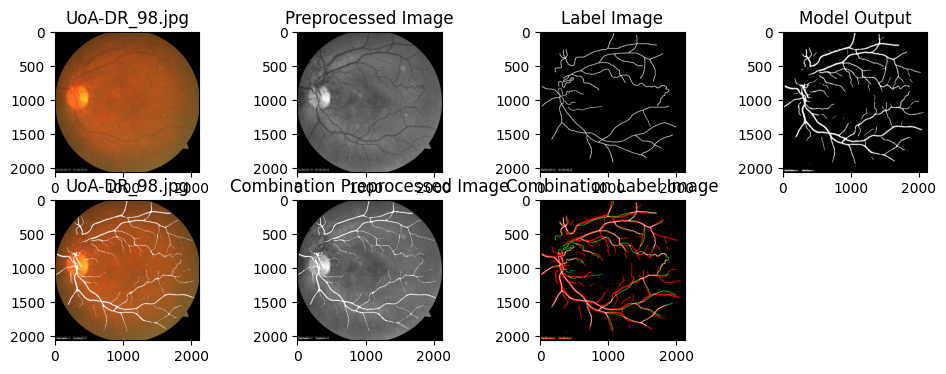

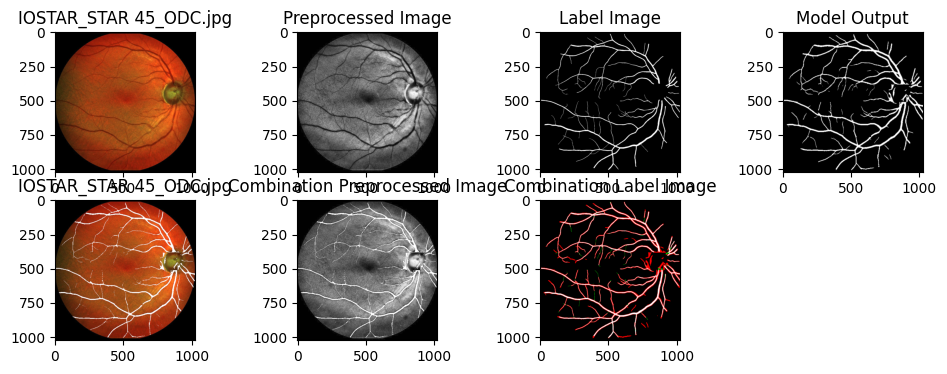

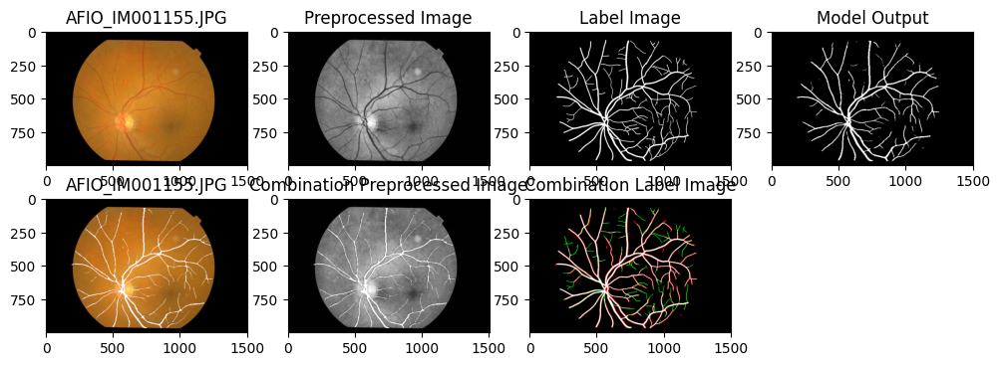

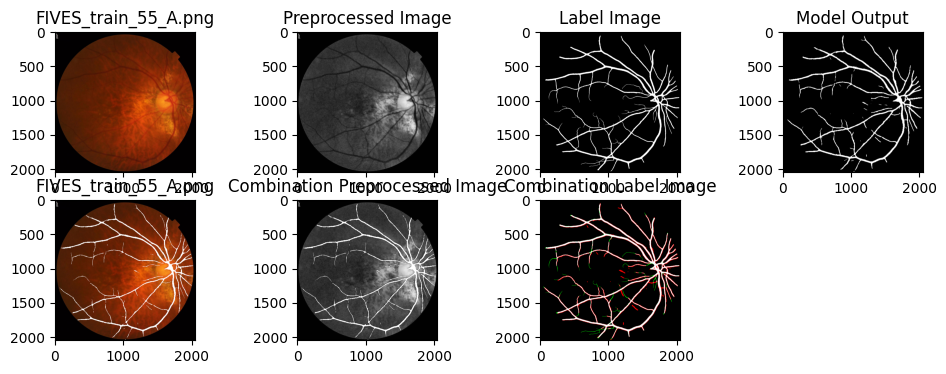

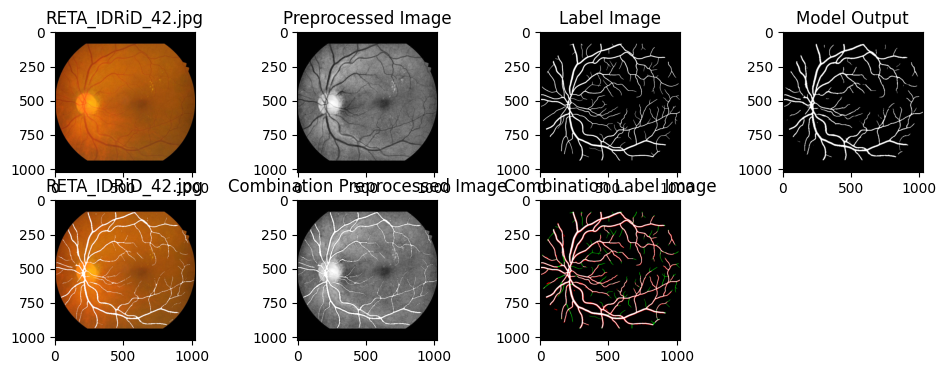

...

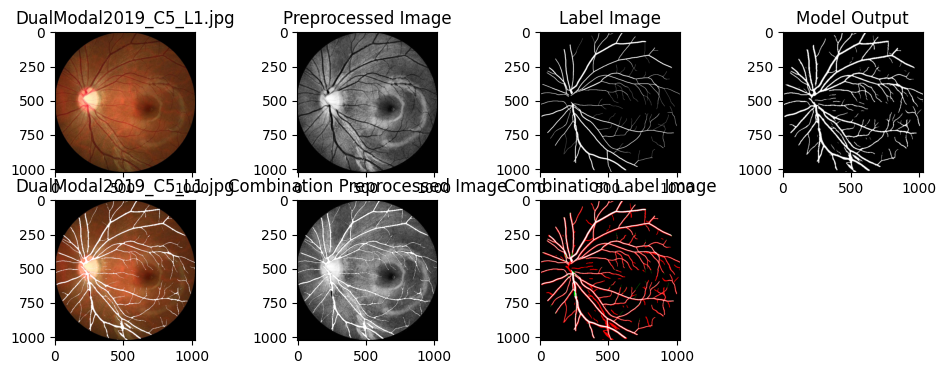

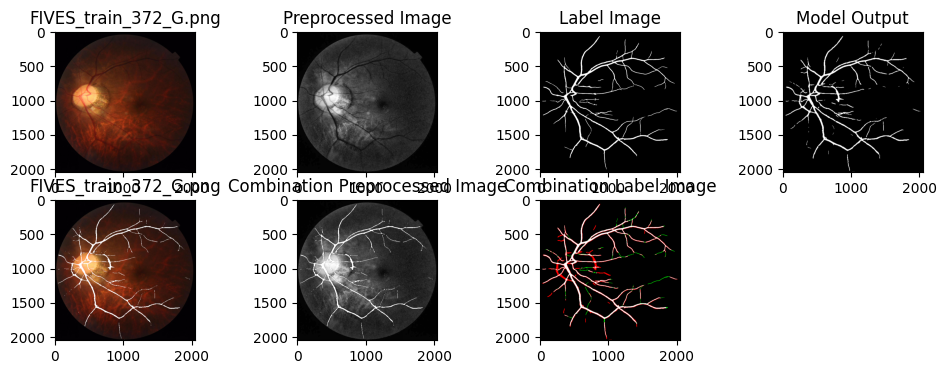

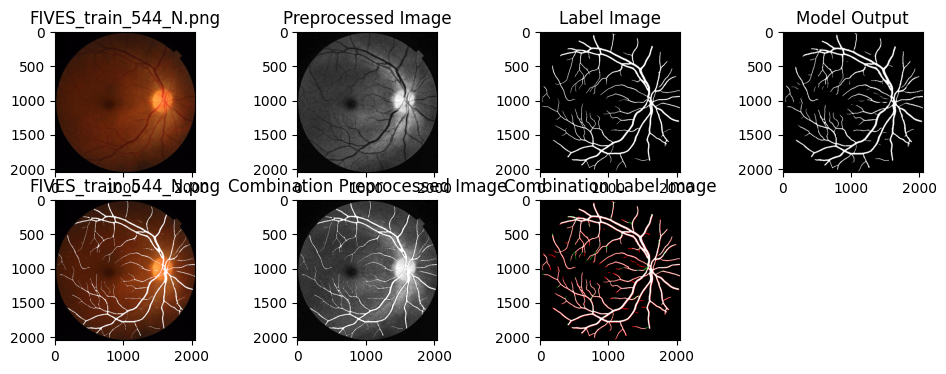

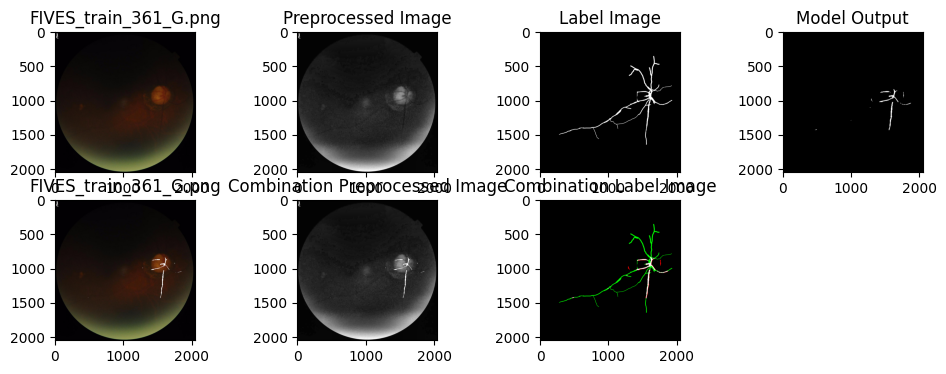

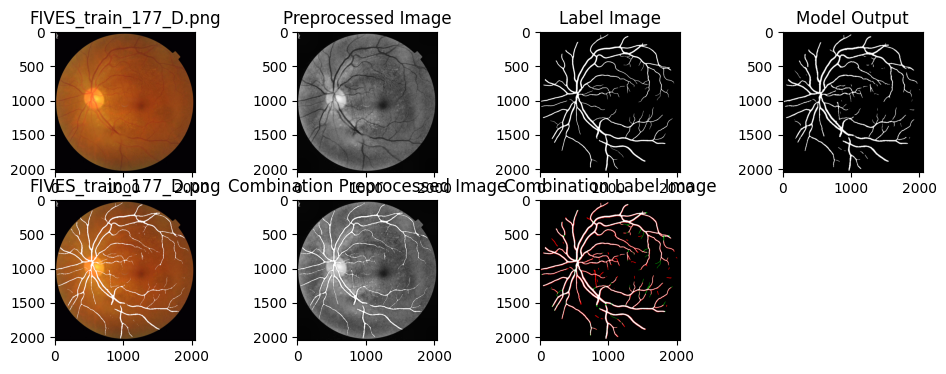

: 

In [3]:
# Load the model with custom_objects parameter
model = tf.keras.models.load_model(MODEL_PATH, custom_objects=custom_objects)

# Plot model result
num_images_to_select = 50
check_result.visualize_SG_result(model, num_images_to_select, SOURCE, INPUT_SHAPE, RESIZE_SHAPE, test_preproc)